In [1]:
import os
import shutil
from pathlib import Path
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import cv2
from ultralytics import YOLO

In [2]:
root = Path("dataset/CVSubset/FLAME")
fire_images = list((root / 'Fire' / 'Thermal' / 'Raw JPG').glob('*.JPG'))
no_fire_images = list((root / 'No Fire' / 'Thermal' / 'Raw JPG').glob('*.JPG'))
fire_labels = [(root / 'Fire' / 'labels' / f"{img.stem}.txt") for img in fire_images]
no_fire_labels = [None] * len(no_fire_images)

In [3]:
all_images = fire_images + no_fire_images
all_labels = fire_labels + no_fire_labels
all_classes = [0] * len(fire_images) + [1] * len(no_fire_images)  

In [4]:
img_temp, test_img, lbl_temp, test_lbl = train_test_split(
    all_images, all_labels, test_size=0.1, random_state=42, stratify=all_classes)

train_img, val_img, train_lbl, val_lbl = train_test_split(
    img_temp, lbl_temp, test_size=0.2, random_state=42)

while len(val_img) < 12:
    train_img, val_img, train_lbl, val_lbl = train_test_split(
        img_temp, lbl_temp, test_size=0.3, random_state=42)


In [5]:
yolo_dataset = root / 'yolo_dataset'
splits = ['train', 'val', 'test']

In [6]:
for split in splits:
    (yolo_dataset / 'images' / split).mkdir(parents=True, exist_ok=True)
    (yolo_dataset / 'labels' / split).mkdir(parents=True, exist_ok=True)



In [7]:
def copy_data(images, labels, split):
    img_dest = yolo_dataset / 'images' / split
    lbl_dest = yolo_dataset / 'labels' / split
    for img, lbl in zip(images, labels):
        shutil.copy(img, img_dest / img.name)
        if lbl and lbl.exists():
            shutil.copy(lbl, lbl_dest / lbl.name)
        else:
            (lbl_dest / f"{img.stem}.txt").write_text("")  



In [8]:
copy_data(train_img, train_lbl, 'train')
copy_data(val_img, val_lbl, 'val')
copy_data(test_img, test_lbl, 'test')

print("✅ Dataset prepared at:", yolo_dataset)


✅ Dataset prepared at: dataset/CVSubset/FLAME/yolo_dataset


In [9]:
ls dataset/CVSubset/FLAME/yolo_dataset/images/val

00003.JPG  00295.JPG
00005.JPG  00296.JPG
00007.JPG  00301.JPG
00008.JPG  00303.JPG
00010.JPG  00304.JPG
00011.JPG  00308.JPG
00018.JPG  00310.JPG
00019.JPG  00311.JPG
00020.JPG  00317.JPG
00021.JPG  00331.JPG
00022.JPG  00335.JPG
00024.JPG  00338.JPG
00027.JPG  00339.JPG
00031.JPG  00340.JPG
00034.JPG  00343.JPG
00036.JPG  00357.JPG
00038.JPG  00359.JPG
00040.JPG  00370.JPG
00041.JPG  00374.JPG
00044.JPG  00377.JPG
00046.JPG  00386.JPG
00053.JPG  00390.JPG
00060.JPG  00398.JPG
00062.JPG  00414.JPG
00071.JPG  00419.JPG
00074.JPG  00425.JPG
00075.JPG  00432.JPG
00076.JPG  00438.JPG
00079.JPG  00439.JPG
00085.JPG  00443.JPG
00088.JPG  00468.JPG
00089.JPG  00472.JPG
00091.JPG  00478.JPG
00092.JPG  00479.JPG
00095.JPG  00481.JPG
00098.JPG  00485.JPG
00103.JPG  00489.JPG
00105.JPG  00490.JPG
00106.JPG  00494.JPG
00113.JPG  00504.JPG
00114.JPG  00508.JPG
00149.JPG  00511.JPG
00151.JPG  00512.JPG
00160.JPG  00525.JPG
00163.JPG  00529.JPG
00166.JPG  00536.JPG
00182.JPG  00555.JPG
00189.JPG  00

In [16]:
model = YOLO('yolov8s.pt')  

model.train(
    data='fire.yaml',
    epochs=150,
    imgsz=640,
    batch=4,
    name='yolov8_fire_detection',
    patience=10
)

Ultralytics 8.3.152 🚀 Python-3.12.2 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 5815MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=fire.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8_fire_detection69, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=10, perspective=0.0, plots=True,

train: Scanning /home/lakshmi/collage/project/vssc/wildfire-detection/dataset/CVSubset/FLAME/yolo_dataset/labels/train.cache... 516 images, 56 backgrounds, 0 corrupt: 100%|██████████| 516/516 [00:00<?, ?it/s]


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 319.8±160.0 MB/s, size: 25.6 KB)


val: Scanning /home/lakshmi/collage/project/vssc/wildfire-detection/dataset/CVSubset/FLAME/yolo_dataset/labels/val.cache... 142 images, 21 backgrounds, 0 corrupt: 100%|██████████| 142/142 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8_fire_detection69/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/yolov8_fire_detection69
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      1.29G      1.572      2.513      1.686          9        640: 100%|██████████| 129/129 [00:10<00:00, 12.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:00<00:00, 18.69it/s]

                   all        142        133       0.51      0.226      0.287      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      1.48G      1.684      1.997      1.762         12        640: 100%|██████████| 129/129 [00:10<00:00, 12.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 17.60it/s]

                   all        142        133     0.0783      0.526     0.0658     0.0271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      1.48G      1.764      1.862      1.813         12        640: 100%|██████████| 129/129 [00:11<00:00, 11.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 16.66it/s]

                   all        142        133     0.0932      0.301     0.0924     0.0377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150      1.48G      1.752      1.823      1.803          7        640: 100%|██████████| 129/129 [00:11<00:00, 11.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 16.72it/s]

                   all        142        133      0.682      0.474      0.571      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      1.48G      1.787      1.752      1.806          6        640: 100%|██████████| 129/129 [00:11<00:00, 11.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.87it/s]

                   all        142        133       0.43      0.526      0.456      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      1.48G      1.736       1.64      1.778          7        640: 100%|██████████| 129/129 [00:11<00:00, 10.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 16.10it/s]

                   all        142        133      0.417      0.481      0.365      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      1.48G      1.725      1.633      1.776          7        640: 100%|██████████| 129/129 [00:11<00:00, 10.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.94it/s]

                   all        142        133      0.669      0.579      0.654      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      1.48G      1.626      1.591      1.713          6        640: 100%|██████████| 129/129 [00:11<00:00, 10.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.70it/s]

                   all        142        133      0.737      0.548      0.652      0.306



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      1.48G      1.602      1.522      1.654          9        640: 100%|██████████| 129/129 [00:11<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.76it/s]

                   all        142        133      0.652      0.692      0.743      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      1.48G      1.637       1.52      1.654          9        640: 100%|██████████| 129/129 [00:11<00:00, 10.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.47it/s]

                   all        142        133      0.769      0.699      0.751       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      1.52G       1.59      1.525      1.671          8        640: 100%|██████████| 129/129 [00:12<00:00, 10.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.76it/s]

                   all        142        133      0.793      0.662       0.78      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      1.52G      1.553      1.411      1.652          9        640: 100%|██████████| 129/129 [00:11<00:00, 10.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.90it/s]

                   all        142        133      0.692      0.707      0.742      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      1.55G      1.629      1.534       1.66         12        640: 100%|██████████| 129/129 [00:11<00:00, 10.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.41it/s]

                   all        142        133      0.815       0.73       0.86      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      1.55G      1.546      1.431      1.626          7        640: 100%|██████████| 129/129 [00:11<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.31it/s]

                   all        142        133      0.701      0.594      0.733      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      1.59G      1.498      1.381      1.586          7        640: 100%|██████████| 129/129 [00:12<00:00, 10.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 14.90it/s]

                   all        142        133      0.742      0.812      0.821      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      1.63G       1.54      1.377      1.595         12        640: 100%|██████████| 129/129 [00:13<00:00,  9.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.08it/s]

                   all        142        133      0.714      0.699      0.757      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      1.63G       1.48      1.312      1.548         11        640: 100%|██████████| 129/129 [00:12<00:00,  9.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 14.26it/s]

                   all        142        133      0.754      0.713      0.812      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      1.63G      1.481      1.359      1.562         10        640: 100%|██████████| 129/129 [00:13<00:00,  9.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.48it/s]

                   all        142        133      0.773      0.795      0.833      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      1.63G      1.429      1.318      1.513          8        640: 100%|██████████| 129/129 [00:12<00:00, 10.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.69it/s]

                   all        142        133      0.744      0.699      0.779      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      1.63G       1.44      1.311      1.529          6        640: 100%|██████████| 129/129 [00:12<00:00, 10.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.49it/s]

                   all        142        133      0.732      0.789      0.814      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      1.63G       1.44      1.287       1.52          8        640: 100%|██████████| 129/129 [00:12<00:00, 10.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 14.64it/s]

                   all        142        133      0.883      0.729      0.866        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      1.63G      1.417      1.284      1.543         12        640: 100%|██████████| 129/129 [00:11<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.57it/s]

                   all        142        133      0.708      0.819      0.813      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      1.63G      1.399      1.253       1.52          7        640: 100%|██████████| 129/129 [00:12<00:00, 10.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.50it/s]

                   all        142        133      0.789      0.759      0.849       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      1.63G      1.384      1.245      1.498          9        640: 100%|██████████| 129/129 [00:12<00:00, 10.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.09it/s]

                   all        142        133      0.768      0.798      0.854      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      1.63G       1.46      1.293      1.522          6        640: 100%|██████████| 129/129 [00:12<00:00, 10.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 14.80it/s]

                   all        142        133      0.735      0.812      0.844       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      1.63G       1.45      1.251      1.511          7        640: 100%|██████████| 129/129 [00:12<00:00, 10.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.13it/s]

                   all        142        133      0.751      0.782      0.845      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      1.63G      1.456      1.251      1.545          8        640: 100%|██████████| 129/129 [00:12<00:00, 10.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.65it/s]

                   all        142        133      0.827      0.789      0.864      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      1.63G      1.412      1.235       1.52         12        640: 100%|██████████| 129/129 [00:12<00:00, 10.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.72it/s]

                   all        142        133      0.844      0.811      0.865       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150      1.63G      1.433      1.235      1.539          9        640: 100%|██████████| 129/129 [00:12<00:00, 10.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.46it/s]

                   all        142        133      0.765      0.789      0.836      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      1.63G      1.372      1.233      1.459         13        640: 100%|██████████| 129/129 [00:12<00:00, 10.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.54it/s]

                   all        142        133      0.792      0.782      0.871      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      1.63G      1.374      1.203      1.466         16        640: 100%|██████████| 129/129 [00:12<00:00, 10.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.52it/s]

                   all        142        133      0.777      0.729      0.843      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150      1.63G      1.406      1.261      1.501          9        640: 100%|██████████| 129/129 [00:12<00:00, 10.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.66it/s]

                   all        142        133      0.759      0.805      0.856      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      1.63G      1.365      1.162      1.462         11        640: 100%|██████████| 129/129 [00:12<00:00, 10.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.21it/s]

                   all        142        133      0.779      0.774      0.858      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      1.63G      1.327      1.169      1.453          9        640: 100%|██████████| 129/129 [00:12<00:00, 10.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.51it/s]

                   all        142        133      0.811      0.774      0.878      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      1.63G      1.305      1.125       1.46          7        640: 100%|██████████| 129/129 [00:12<00:00, 10.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.53it/s]

                   all        142        133      0.836      0.774      0.884      0.549



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      1.63G      1.364      1.161      1.474          9        640: 100%|██████████| 129/129 [00:12<00:00, 10.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.37it/s]

                   all        142        133      0.798      0.833      0.902       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      1.63G      1.342      1.164      1.489         10        640: 100%|██████████| 129/129 [00:12<00:00, 10.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.75it/s]

                   all        142        133      0.773      0.827      0.845      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      1.63G      1.342      1.158      1.518          7        640: 100%|██████████| 129/129 [00:12<00:00, 10.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.69it/s]

                   all        142        133      0.704      0.786      0.829      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      1.63G      1.326      1.145      1.483          8        640: 100%|██████████| 129/129 [00:11<00:00, 10.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.84it/s]

                   all        142        133      0.797      0.789       0.86      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      1.63G      1.352      1.179      1.493         10        640: 100%|██████████| 129/129 [00:11<00:00, 10.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.91it/s]

                   all        142        133      0.859      0.744      0.887      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      1.63G       1.36      1.171      1.466          6        640: 100%|██████████| 129/129 [00:11<00:00, 10.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 16.10it/s]

                   all        142        133       0.84      0.835      0.884      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      1.63G      1.295      1.134       1.46          7        640: 100%|██████████| 129/129 [00:11<00:00, 10.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.88it/s]

                   all        142        133      0.781      0.832      0.847      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      1.63G       1.31       1.13       1.44         11        640: 100%|██████████| 129/129 [00:12<00:00, 10.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.91it/s]

                   all        142        133      0.847      0.805      0.874      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      1.63G       1.28      1.084      1.453         13        640: 100%|██████████| 129/129 [00:12<00:00, 10.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.79it/s]

                   all        142        133      0.887      0.744      0.879      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      1.63G       1.33      1.137      1.449         13        640: 100%|██████████| 129/129 [00:12<00:00, 10.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.56it/s]

                   all        142        133       0.75      0.814      0.859      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      1.63G      1.291       1.11      1.442         14        640: 100%|██████████| 129/129 [00:11<00:00, 10.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.89it/s]

                   all        142        133      0.824      0.812      0.876      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      1.63G      1.326      1.149      1.469         11        640: 100%|██████████| 129/129 [00:12<00:00, 10.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.86it/s]

                   all        142        133      0.825      0.827      0.889      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      1.63G      1.245      1.095      1.401          7        640: 100%|██████████| 129/129 [00:11<00:00, 10.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.93it/s]

                   all        142        133      0.825      0.805      0.872      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      1.63G      1.251       1.06      1.416          6        640: 100%|██████████| 129/129 [00:11<00:00, 10.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 16.09it/s]

                   all        142        133      0.773      0.819      0.859      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      1.63G      1.233      1.075      1.391         14        640: 100%|██████████| 129/129 [00:11<00:00, 10.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.91it/s]

                   all        142        133      0.766       0.82       0.85      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      1.63G      1.297      1.097      1.429          9        640: 100%|██████████| 129/129 [00:11<00:00, 10.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.80it/s]

                   all        142        133      0.831      0.853      0.886      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      1.63G      1.293      1.102      1.432          7        640: 100%|██████████| 129/129 [00:11<00:00, 10.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.72it/s]

                   all        142        133      0.823      0.837      0.877      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      1.63G      1.247      1.089        1.4          5        640: 100%|██████████| 129/129 [00:12<00:00, 10.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.92it/s]

                   all        142        133      0.803      0.829       0.89      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      1.63G      1.259        1.1      1.418          7        640: 100%|██████████| 129/129 [00:11<00:00, 10.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 16.07it/s]

                   all        142        133      0.864      0.815      0.892      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      1.63G      1.263      1.042      1.419          6        640: 100%|██████████| 129/129 [00:11<00:00, 10.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.95it/s]

                   all        142        133      0.869      0.797      0.893      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      1.63G      1.263      1.042      1.422          9        640: 100%|██████████| 129/129 [00:11<00:00, 10.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.83it/s]

                   all        142        133       0.83       0.82      0.871      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      1.63G      1.277      1.045      1.405          9        640: 100%|██████████| 129/129 [00:12<00:00, 10.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.79it/s]

                   all        142        133      0.799      0.812      0.872      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      1.63G      1.253       1.06      1.399         10        640: 100%|██████████| 129/129 [00:12<00:00, 10.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.79it/s]

                   all        142        133      0.754       0.85      0.882      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      1.63G      1.257      1.076      1.406          7        640: 100%|██████████| 129/129 [00:12<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.79it/s]

                   all        142        133      0.816      0.797      0.891       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      1.63G      1.275      1.107      1.439         11        640: 100%|██████████| 129/129 [00:12<00:00, 10.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 14.78it/s]

                   all        142        133       0.83       0.85      0.901      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      1.63G      1.254      1.043      1.402          7        640: 100%|██████████| 129/129 [00:11<00:00, 10.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.92it/s]

                   all        142        133      0.835      0.857       0.88      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      1.63G      1.234      1.003      1.401         11        640: 100%|██████████| 129/129 [00:12<00:00, 10.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.55it/s]

                   all        142        133      0.863      0.767       0.89      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      1.63G      1.237       1.01      1.402          9        640: 100%|██████████| 129/129 [00:13<00:00,  9.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.22it/s]

                   all        142        133      0.856      0.805      0.903      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150      1.63G      1.244       1.04      1.416         15        640: 100%|██████████| 129/129 [00:11<00:00, 10.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.70it/s]

                   all        142        133      0.874      0.831      0.904       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      1.63G      1.209      1.045      1.388         14        640: 100%|██████████| 129/129 [00:12<00:00, 10.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 14.82it/s]

                   all        142        133      0.856      0.789      0.902      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150      1.63G       1.22      1.018      1.414          7        640: 100%|██████████| 129/129 [00:12<00:00, 10.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.06it/s]

                   all        142        133      0.849      0.805      0.895      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      1.63G      1.218      1.028      1.381          9        640: 100%|██████████| 129/129 [00:12<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 14.57it/s]

                   all        142        133      0.824      0.808      0.876       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      1.63G      1.207     0.9934      1.388         12        640: 100%|██████████| 129/129 [00:12<00:00, 10.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.61it/s]

                   all        142        133      0.866      0.826      0.881      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      1.63G      1.291      1.039      1.415          9        640: 100%|██████████| 129/129 [00:12<00:00, 10.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.98it/s]

                   all        142        133      0.855      0.812      0.883      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      1.63G       1.21      1.047      1.389         10        640: 100%|██████████| 129/129 [00:12<00:00, 10.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.90it/s]

                   all        142        133      0.732      0.812      0.856      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150      1.63G      1.193     0.9583      1.368         12        640: 100%|██████████| 129/129 [00:12<00:00, 10.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.54it/s]

                   all        142        133      0.787      0.808       0.87      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      1.63G      1.205      1.014      1.386         11        640: 100%|██████████| 129/129 [00:12<00:00, 10.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.81it/s]

                   all        142        133      0.873      0.737      0.877      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      1.63G      1.218      1.005       1.39         11        640: 100%|██████████| 129/129 [00:12<00:00, 10.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 15.67it/s]

                   all        142        133      0.828      0.812      0.879      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      1.63G      1.211     0.9963      1.388          6        640: 100%|██████████| 129/129 [00:12<00:00, 10.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 16.02it/s]

                   all        142        133      0.846      0.767      0.883      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      1.63G      1.149     0.9862      1.353          7        640: 100%|██████████| 129/129 [00:12<00:00,  9.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 14.65it/s]

                   all        142        133      0.728      0.789      0.834       0.54
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 65, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



75 epochs completed in 0.297 hours.
Optimizer stripped from runs/detect/yolov8_fire_detection69/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/yolov8_fire_detection69/weights/best.pt, 22.5MB

Validating runs/detect/yolov8_fire_detection69/weights/best.pt...
Ultralytics 8.3.152 🚀 Python-3.12.2 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 5815MiB)
Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 18/18 [00:01<00:00, 16.07it/s]


                   all        142        133      0.852      0.789      0.901      0.602
                  fire        121        133      0.852      0.789      0.901      0.602
Speed: 0.2ms preprocess, 4.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/yolov8_fire_detection69


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a7b005f8bf0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

In [17]:
results = model.val(
    data='fire.yaml',
    split='test' 
)
print(results)

Ultralytics 8.3.152 🚀 Python-3.12.2 torch-2.7.0+cu118 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 5815MiB)
Model summary (fused): 72 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 0.9±0.6 MB/s, size: 41.5 KB)


val: Scanning /home/lakshmi/collage/project/vssc/wildfire-detection/dataset/CVSubset/FLAME/yolo_dataset/labels/test.cache... 77 images, 9 backgrounds, 0 corrupt: 100%|██████████| 77/77 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:01<00:00, 15.98it/s]


                   all         77         79      0.833       0.81      0.869      0.551
                  fire         68         79      0.833       0.81      0.869      0.551
Speed: 0.5ms preprocess, 6.0ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/yolov8_fire_detection692
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7a7ad03c7860>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.

In [18]:
presults = model.predict(source=str(yolo_dataset / 'images' / 'test'), conf=0.25, save=True)


image 1/77 /home/lakshmi/collage/project/vssc/wildfire-detection/dataset/CVSubset/FLAME/yolo_dataset/images/test/00009.JPG: 512x640 (no detections), 6.8ms
image 2/77 /home/lakshmi/collage/project/vssc/wildfire-detection/dataset/CVSubset/FLAME/yolo_dataset/images/test/00011.JPG: 512x640 1 fire, 6.4ms
image 3/77 /home/lakshmi/collage/project/vssc/wildfire-detection/dataset/CVSubset/FLAME/yolo_dataset/images/test/00012.JPG: 512x640 1 fire, 6.3ms
image 4/77 /home/lakshmi/collage/project/vssc/wildfire-detection/dataset/CVSubset/FLAME/yolo_dataset/images/test/00015.JPG: 512x640 1 fire, 6.4ms
image 5/77 /home/lakshmi/collage/project/vssc/wildfire-detection/dataset/CVSubset/FLAME/yolo_dataset/images/test/00023.JPG: 512x640 1 fire, 6.3ms
image 6/77 /home/lakshmi/collage/project/vssc/wildfire-detection/dataset/CVSubset/FLAME/yolo_dataset/images/test/00026.JPG: 512x640 (no detections), 6.2ms
image 7/77 /home/lakshmi/collage/project/vssc/wildfire-detection/dataset/CVSubset/FLAME/yolo_dataset/imag

In [19]:
preds, y_true = [], []
for result, lbl in zip(presults, test_lbl):
    y_true.append(0 if lbl else 1)
    has_boxes = result.boxes is not None and result.boxes.cls.numel() > 0
    preds.append(int(result.boxes.cls[0]) if has_boxes else -1)
valid_preds, valid_true = zip(*[(p, y) for p, y in zip(preds, y_true) if p != -1])

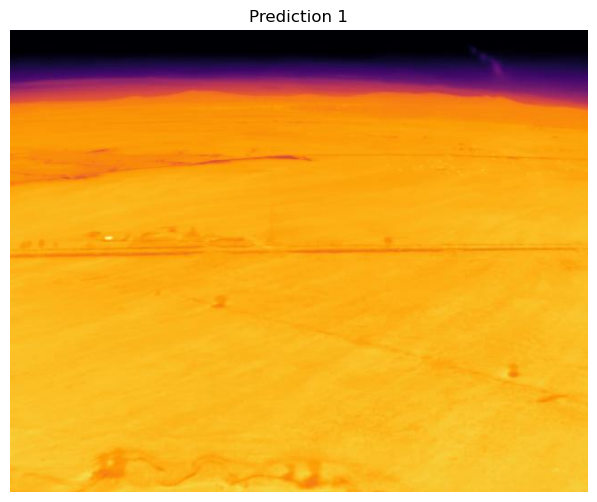

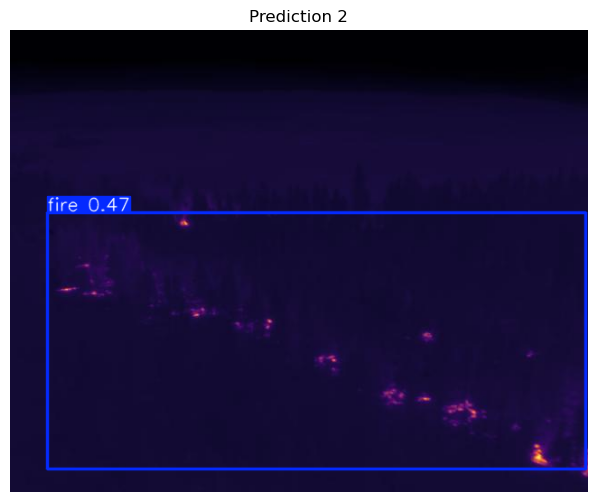

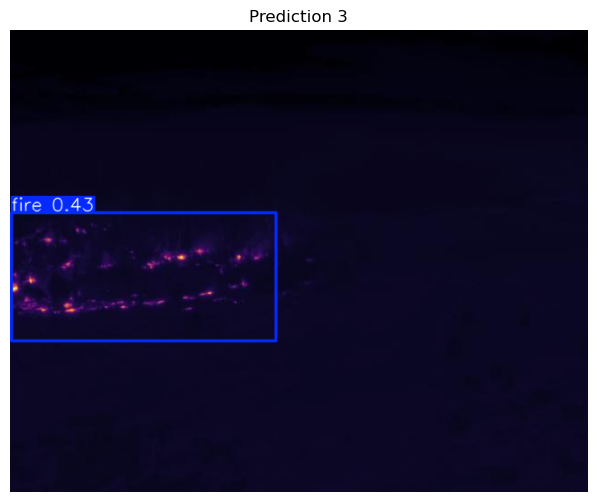

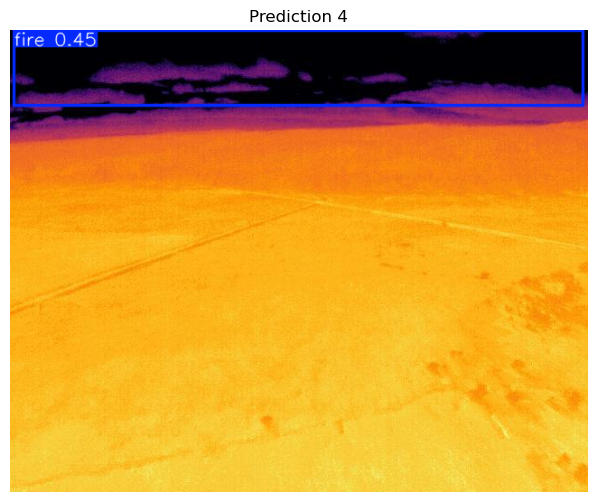

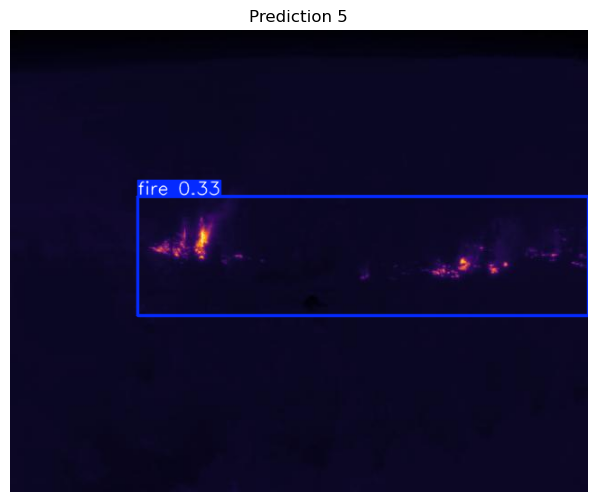

...

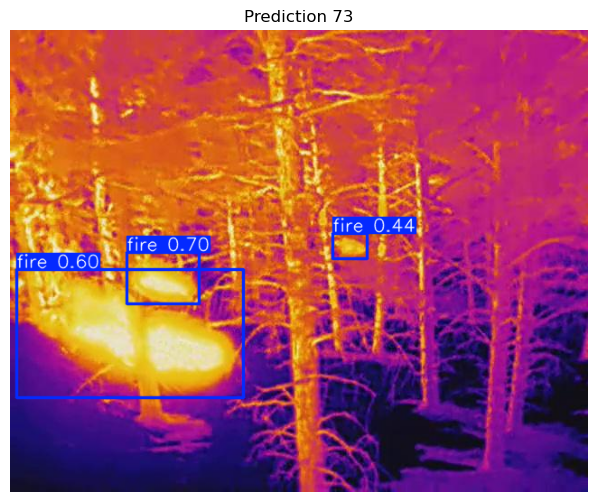

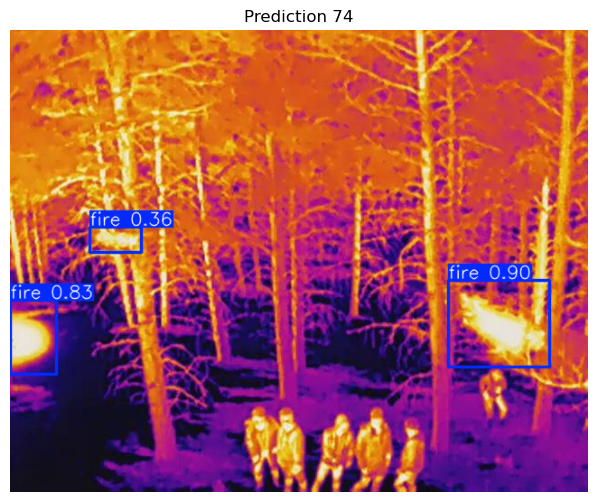

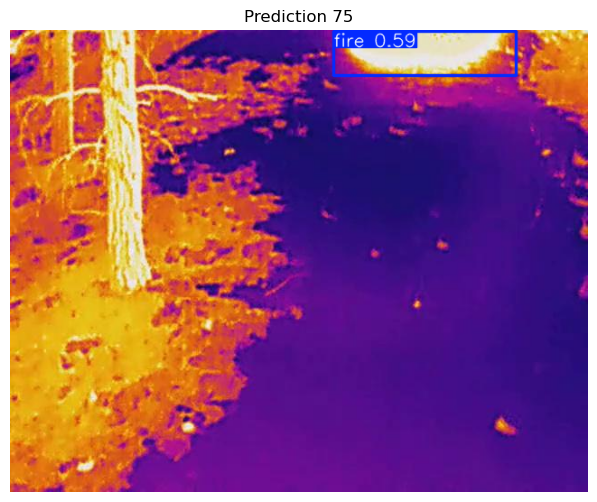

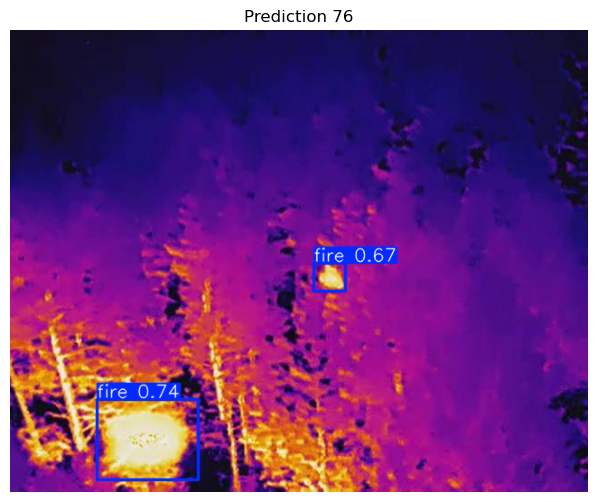

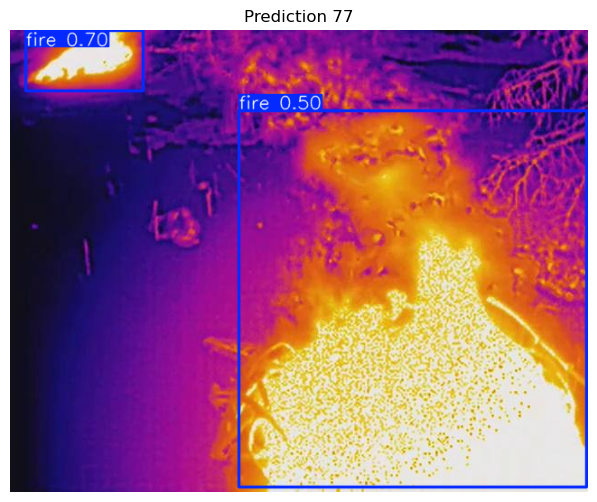

In [20]:
%matplotlib inline
for i, result in enumerate(presults):
    img = result.plot()  
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 6))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title(f'Prediction {i + 1}')
    plt.show()